# Helpers

In [1]:
from typing import Dict, List, Callable, Type, Any, Union, Literal, Optional
from pathlib import Path
import sys
import os

WORKSPACE_DIR = Path("/workspaces/projects/perturbations/")
sys.path.append(WORKSPACE_DIR.as_posix())
sys.path.append((WORKSPACE_DIR / "src").as_posix())

import pandas as pd
import torch
import matplotlib.pyplot as plt
import sklearn.manifold as skm
import seaborn as sns
import numpy as np
import scipy.stats as sstats
from matplotlib.colors import LinearSegmentedColormap
from sklearn.metrics.pairwise import cosine_similarity
from torchmetrics.image import StructuralSimilarityIndexMeasure
from sklearn.decomposition import PCA


from models import PLAD
from models.base import BaseModule
from models.backbones import BaseBackbone
from datasets import FMNIST, CIFAR10, CIFAR10Features, BaseDataModule, FMNISTFeatures, SPARKFeatures
from misc.trainer import Trainer
from analysis import Experiment, PLADInspector, FeaturePLADInspector, FeatureRCSPLADInspector, FeatureCSPLADInspector


ROOT_DIR = "/data-isilon/results/perturbations/"
MLFLOW_ROOT_DIR = (Path(ROOT_DIR) / "mlruns").as_posix()
LOGS_ROOT_DIR = (Path(ROOT_DIR) / "lightning_logs").as_posix()
# MLFLOW_ROOT_DIR = (Path(ROOT_DIR) / "mlruns_9").as_posix()
# LOGS_ROOT_DIR = ("/data/results/perturbations/lightning_logs_9")

os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
pd.set_option('display.max_colwidth', 3000)

sns.set(style="whitegrid")

/opt/conda/envs/perturbations/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
def get_models(xp: Experiment, model_class: Type[BaseModule], **kwargs: Any) -> Dict[int, BaseModule]:
    best_models : Dict[int, BaseModule] = {}

    for class_ in range(10):
        class_runs = xp.runs.with_normal_class(class_).filter_columns(["run_id", "metrics.best_val_auc", "params.TB_folder", "params.best_model_path"]).format_log_paths()
        class_runs = class_runs.sort_values("metrics.best_val_auc", ascending=False)

        best_model_checkpoint = Path(LOGS_ROOT_DIR) / class_runs.iloc[0]["params.best_model_path"]
        model = model_class.load_from_checkpoint(best_model_checkpoint, strict=False, **kwargs)

        best_models[class_] = model
        best_models[class_].truncate()

    return best_models

def get_predictions(trainer: Trainer, best_models: Dict[int, Union[PLADInspector, FeaturePLADInspector]], datamodule: BaseDataModule, features_given_directly: bool) -> Dict[int, torch.Tensor]:
    preds = {}

    for class_ in range(10):
        if isinstance(best_models[class_], FeaturePLADInspector) and not features_given_directly:
            best_models[class_].on_images()

        best_models[class_].get_normal()
        preds_ = trainer.predict(best_models[class_], datamodule)
        preds_ = torch.cat(preds_)

        preds[class_] = preds_
    
    return preds

def get_sorted(preds: Dict[int, torch.Tensor], datamodule: BaseDataModule) -> Dict[int, Dict[int, torch.Tensor]]:
    return {
        class_: {
            class__: preds[class_][datamodule.val_set.targets == class__]
            for class__ in range(10)
        }
        for class_ in range(10)
    }


def get_pseudo_predictions(trainer: Trainer, best_models: Dict[int, Union[PLADInspector, FeaturePLADInspector]], datamodule: BaseDataModule, features_given_directly: bool) -> Dict[int, torch.Tensor]:
    pseudo_preds : Dict[int, torch.Tensor]= {}

    for class_ in range(10):
        if isinstance(best_models[class_], FeaturePLADInspector) and not features_given_directly:
            best_models[class_].on_images()
        
        # best_models[class_].on_pseudo_anomalies()
        best_models[class_].get_pseudo_anomalies()
        preds_ = trainer.predict(best_models[class_], datamodule)
        pseudo_preds[class_] = torch.cat(preds_)

    return pseudo_preds

def get_pseudo_sorted(pseudo_preds: Dict[int, torch.Tensor], datamodule: BaseDataModule) -> Dict[int, Dict[str, torch.Tensor]]:
    return {
        class_: {
            "A": pseudo_preds[class_][datamodule.val_set.targets == class_]
        }
        for class_ in range(10)
    }

def compute_ssim(set1, set2):
    ssim = StructuralSimilarityIndexMeasure()
    set1 = torch.tensor(set1, dtype=torch.float32)
    set2 = torch.tensor(set2, dtype=torch.float32)
    for i in range(0, 100):#set2.shape[0]):
        ssim.update(set1, torch.roll(set2, i))

    return ssim.compute().item()

def get_confm(embedded_sorted: Dict[int, Dict[int, torch.Tensor]], compare_func: Literal["wasserstein", "cossim", "ssim"] = "wasserstein") -> List[List[float]]:
    confm = []

    match compare_func:
        case "cossim":
            func = cosine_similarity
        case "ssim":
            func = compute_ssim
        case _:
            func = sstats.wasserstein_distance

    for class_ in range(len(embedded_sorted.keys())):
        row = []
        for class_1 in range(len(embedded_sorted.keys())):
            score = func(embedded_sorted[class_][class_], embedded_sorted[class_][class_1])
            score = np.mean(score)
            row.append(score)

        row_ = row.copy()
        row_.pop(class_)

        row.append(np.mean(row_))
        confm.append(row)

    return np.array(confm)

def pca_predictions(data):
    pcas = dict()
    for i in range(10):
        preds = data[i]
        pca = PCA(n_components=1)
        pcas[i] = pca.fit_transform(preds).flatten()

    return pcas

def tsne_predictions(data, targets):
    tsnes = dict()
    for i in range(10):
        preds = data[i]
        tsnes[i] = skm.TSNE(n_components=1).fit_transform(preds, targets).flatten()

    return tsnes

def get_pseudo_confm(pseudo_sorted, embedded_sorted: Dict[int, Dict[int, torch.Tensor]], compare_func: Literal["wasserstein", "cossim", "ssim"] = "wasserstein") -> List[List[float]]:
    confm = []

    match compare_func:
        case "cossim":
            func = cosine_similarity
        case "ssim":
            func = compute_ssim
        case _:
            func = sstats.wasserstein_distance

    for class_ in range(len(embedded_sorted.keys())):
        row = []
        for class_1 in range(len(embedded_sorted.keys())):
            score = func(pseudo_sorted[class_]["A"], embedded_sorted[class_][class_1])
            # score = func(pseudo_sorted[class_]["A"], pseudo_sorted[class_]["A"])
            score = np.mean(score)
            row.append(score)

        row_ = row.copy()
        row_.pop(class_)

        row.append(np.mean(row_))
        confm.append(row)

    return np.array(confm)

def process(trainer: Trainer, xp: Experiment, datamodule: BaseDataModule, model_class: Type[BaseModule], features_given_directly: bool, kwargs: Any, compare_func: Literal["wasserstein", "cossim", "ssim"] = "wasserstein", use_pca = False):
    best_models = get_models(xp, model_class, **kwargs)

    preds = get_predictions(trainer, best_models, datamodule, features_given_directly)
    pseudo_preds = get_pseudo_predictions(trainer, best_models, datamodule, features_given_directly)

    if use_pca:
        preds_1d = pca_predictions(preds)
        pseudo_preds_1d = pca_predictions(pseudo_preds)
    else:
        preds_1d = tsne_predictions(preds, datamodule.val_set.dataset.targets)
        pseudo_preds_1d = tsne_predictions(pseudo_preds, datamodule.val_set.dataset.targets)

    pseudo_preds_sorted = get_pseudo_sorted(pseudo_preds, datamodule)
    preds_sorted = get_sorted(preds, datamodule)
    pseudo_preds_sorted_1d = get_pseudo_sorted(pseudo_preds_1d, datamodule)
    preds_sorted_1d = get_sorted(preds_1d, datamodule)

    return preds_sorted, pseudo_preds_sorted, preds_sorted_1d, pseudo_preds_sorted_1d

def raw_process(trainer: Trainer, xp: Experiment, datamodule: BaseDataModule, model_class: Type[BaseModule], features_given_directly: bool, kwargs: Any, compare_func: Literal["wasserstein", "cossim", "ssim"] = "wasserstein", use_pca = False):
    best_models = get_models(xp, model_class, **kwargs)

    preds = get_predictions(trainer, best_models, datamodule, features_given_directly)
    pseudo_preds = get_pseudo_predictions(trainer, best_models, datamodule, features_given_directly)

    pseudo_preds_sorted = get_pseudo_sorted(pseudo_preds, datamodule)
    preds_sorted = get_sorted(preds, datamodule)

    return preds_sorted, pseudo_preds_sorted

def process_to_nd(preds_sorted, pseudo_preds_sorted, normal_class, ndim, ratio):
    preds = preds_sorted[normal_class]
    preds_, targets = [preds[normal_class]], [normal_class] * 1000
    for i in list(set(range(10)) - set([normal_class])):
        nb = len(preds[i])
        preds_ += [preds[i][:int(nb * ratio)]]
        targets += [i] * int(nb * ratio)
    
    preds_ += [pseudo_preds_sorted[normal_class]["A"]]
    targets += [-1] * len(pseudo_preds_sorted[normal_class]["A"])
    
    preds_ = torch.concat(preds_)
    targets = torch.tensor(targets, dtype=torch.uint8)

    tsnes = skm.TSNE(n_components=ndim).fit_transform(preds_, targets)
    return tsnes, targets

In [3]:
compare_func_map = {
    "wasserstein": "Wasserstein Distance",
    "cossim": "Cosine Similarity",
    "ssim": "SSIM",
    "ovl": "Overlapping Coefficient"
}


cifar10_keymap = {
    0: "Airplane",
    1: "Automobile",
    2: "Bird",
    3: "Cat",
    4: "Deer",
    5: "Dog",
    6: "Frog",
    7: "Horse",
    8: "Ship",
    9: "Truck",
}

fmnist_keymap = {
    0: "T-Shirt/Top",
    1: "Trouser",
    2: "Pullover",
    3: "Dress",
    4: "Coat",
    5: "Sandal",
    6: "Shirt",
    7: "Sneaker",
    8: "Bag",
    9: "Ankle Boot",
}

spark_keymap = {
    0: "AcrimSat",
    1: "Aquarius",
    2: "Aura",
    3: "Calipso",
    4: "Cloudsat",
    5: "CubeSat",
    6: "Debris",
    7: "Jason",
    8: "Sentinel-6",
    9: "Terra",
    10: "TRMM",
}


def plot_all(preds_sorted, pseudo_preds_sorted, confm, anomaly_confm, title: str, log: bool, keymap: Dict[int, str], format_: str = ".4", compare_func: Literal["wasserstein", "cossim", "ssim"] = "wasserstein", use_pca = False) -> plt.Figure:
    args = {"rc": {'text.usetex' : True, "font.family": 'LM Roman 10', "axes.formatter.use_mathtext": True}, "style": "whitegrid"}
    sns.set(font_scale=1.5, **args)
    
    fig, axes = plt.subplots(2, 5, figsize=(50, 20))
    fig.tight_layout(h_pad=2)
    # sns.set_suptitle(fig, title)
    for class_ in range(10):
        sns.set(font_scale=1.5, **args)
        ax = sns.kdeplot(ax=axes[class_ // 5, class_ % 5], data=preds_sorted[class_], fill=True, common_norm=False, alpha=0.3, legend=True, log_scale=log)
        handles = ax.legend_.legend_handles
        
        anomaly_palette = sns.color_palette([sns.color_palette().as_hex()[class_]])
        ax_ = sns.kdeplot(ax=axes[class_ // 5, class_ % 5], data=pseudo_preds_sorted[class_], fill=True, hatch="/", common_norm=False, alpha=0, legend=True, palette=anomaly_palette, log_scale=log)
        handles_ = ax_.legend_.legend_handles
        handles_[0].set_hatch("//")

        ax.legend(handles=handles + handles_, labels=[*[ f"{k} - {v}" for k, v in keymap.items()], "Pseudo-Ano."])
        ax.set_ylabel("")
        ax.set_title(r"{}".format(f"{title}{' - PCA' if use_pca else ''} ($NC = {class_}$)"), y=1.01)

        sns.move_legend(ax_, "center right", bbox_to_anchor=(1, .75), fontsize=12, facecolor=[0.82352941, 0.82745098, 0.83529412], fancybox=False, framealpha=.4, frameon=False)

        sns.set(font_scale=.8, **args)
        ax2 = ax.inset_axes((0.01, .94, .45, .035))
        
        color = sns.color_palette().as_hex()[class_]
        ax2 = sns.heatmap(
            pd.DataFrame({class_: confm[class_]}).T,
            annot=True,
            fmt=".2",
            cbar=False,
            ax=ax2,
            cmap=sns.light_palette(color, as_cmap=True),
            alpha=.6,
            linewidths=.6,
            linecolor='lightgrey',
            clip_on=False,
        )
        ax2.grid(False)
        ax2.set_title(f"{compare_func_map[compare_func]} to Normal Class", y = .85, loc="left")
        ax2.set_yticks(labels=[], ticks=[])
        for tick in ax2.get_xticklabels():
            tick.set_y(.3)
            tick.set_fontsize(10)

        ax3 = ax.inset_axes((0.54, .94, .45, .035))
        
        ax3 = sns.heatmap(
            pd.DataFrame({class_: anomaly_confm[class_]}).T,
            annot=True,
            fmt=".2",
            cbar=False,
            ax=ax3,
            cmap=sns.light_palette("#000000", as_cmap=True),
            alpha=.6,
            linewidths=.6,
            linecolor='lightgrey',
            clip_on=False,
        )
        ax3.grid(False)
        ax3.set_title(f"{compare_func_map[compare_func]} From Pseudo-Anomalies", y = .85, loc="left")
        ax3.set_yticks(labels=[], ticks=[])
        for tick in ax3.get_xticklabels():
            tick.set_y(.3)
            tick.set_fontsize(10)

    return fig

In [4]:
def process_one(trainer: Trainer, xp: Experiment, datamodule: BaseDataModule, model_class: Type[BaseModule], features_given_directly: bool, kwargs: Any, compare_func: Literal["wasserstein", "cossim", "ssim"] = "wasserstein", use_pca = False):
    class_runs = xp.runs.filter_columns(["run_id", "metrics.best_val_auc", "params.TB_folder", "params.best_model_path"]).format_log_paths()
    class_runs = class_runs.sort_values("metrics.best_val_auc", ascending=False)

    best_model_checkpoint = Path(LOGS_ROOT_DIR) / class_runs.iloc[0]["params.best_model_path"]
    best_model = model_class.load_from_checkpoint(best_model_checkpoint, strict=False, **kwargs)
    best_model.truncate()

    preds = trainer.predict(best_model, datamodule)
    preds = torch.cat(preds)
    
    best_model.on_pseudo_anomalies()
    pseudo_preds = trainer.predict(best_model, datamodule)
    pseudo_preds = torch.cat(pseudo_preds)

    # if use_pca:
    #     preds_1d = pca_predictions(preds)
    #     pseudo_preds_1d = pca_predictions(pseudo_preds)
    # else:
    preds_1d = skm.TSNE(n_components=1).fit_transform(preds, datamodule.val_set.targets).flatten()
    pseudo_preds_1d = skm.TSNE(n_components=1).fit_transform(pseudo_preds, datamodule.val_set.targets).flatten()

    pseudo_preds_sorted = {
        "A": pseudo_preds[datamodule.val_set.targets != 6]
    }
    preds_sorted = {
        class_: preds[datamodule.val_set.targets == class_]
        for class_ in range(11)
    }
    pseudo_preds_sorted_1d = {
        "A": pseudo_preds_1d[datamodule.val_set.targets != 6]
    }
    preds_sorted_1d = {
        class_: preds_1d[datamodule.val_set.targets == class_]
        for class_ in range(11)
    }
    
    return preds_sorted, pseudo_preds_sorted, preds_sorted_1d, pseudo_preds_sorted_1d

In [5]:
def spark_confm(embedded_sorted, anomalies):
    row = []
    row_ano = []
    for class_ in range(11):
        score = cosine_similarity(embedded_sorted[6], embedded_sorted[class_])
        score = np.mean(score)
        row.append(score)
        
    for class_ in range(11):
        score = cosine_similarity(anomalies, embedded_sorted[class_])
        score = np.mean(score)
        row_ano.append(score)

    row_ = row.copy()
    row_.pop(6)

    row.append(np.mean(row_))
    row_ano.append(np.mean(row_ano))

    return row, row_ano

In [6]:
def plot_one(preds_sorted, pseudo_preds_sorted, confm, anomaly_confm, title: str, log: bool, keymap: Dict[int, str], format_: str = ".4", compare_func: Literal["wasserstein", "cossim", "ssim"] = "wasserstein", use_pca = False) -> plt.Figure:
    args = {"rc": {'text.usetex' : True, "font.family": 'LM Roman 10', "axes.formatter.use_mathtext": True}, "style": "whitegrid"}
    sns.set(font_scale=1.5, **args)
    
    fig, axes = plt.subplots(1, 1, figsize=(10, 10))
    fig.tight_layout(h_pad=2)
    # sns.set_suptitle(fig, title)
    sns.set(font_scale=1.5, **args)
    ax = sns.kdeplot(ax=axes, data=preds_sorted, fill=True, common_norm=False, alpha=0.3, legend=True, log_scale=log, palette=sns.color_palette(n_colors=11))
    handles = ax.legend_.legend_handles
    
    anomaly_palette = sns.color_palette([sns.color_palette().as_hex()[0]])
    ax_ = sns.kdeplot(ax=axes, data=pseudo_preds_sorted, fill=True, hatch="/", common_norm=False, alpha=0, legend=True, palette=anomaly_palette, log_scale=log)
    handles_ = ax_.legend_.legend_handles
    handles_[0].set_hatch("//")

    ax.legend(handles=handles + handles_, labels=[*[ f"{k} - {v}" for k, v in keymap.items()], "Pseudo-Ano."])
    ax.set_ylabel("")
    ax.set_title(r"{}".format(f"{title}{' - PCA' if use_pca else ''}"), y=1.01)

    sns.move_legend(ax_, "center right", bbox_to_anchor=(1, .75), fontsize=12, facecolor=[0.82352941, 0.82745098, 0.83529412], fancybox=False, framealpha=.4, frameon=False)

    sns.set(font_scale=.8, **args)
    ax2 = ax.inset_axes((0.01, .94, .45, .035))
    
    color = sns.color_palette().as_hex()[0]
    ax2 = sns.heatmap(
        pd.DataFrame({0: confm}).T,
        annot=True,
        fmt=".2",
        cbar=False,
        ax=ax2,
        cmap=sns.light_palette(color, as_cmap=True),
        alpha=.6,
        linewidths=.6,
        linecolor='lightgrey',
        clip_on=False,
    )
    ax2.grid(False)
    ax2.set_title(f"{compare_func_map[compare_func]} From Debris", y = .85, loc="left")
    ax2.set_yticks(labels=[], ticks=[])
    for tick in ax2.get_xticklabels():
        tick.set_y(.3)
        tick.set_fontsize(10)

    ax3 = ax.inset_axes((0.54, .94, .45, .035))
    
    ax3 = sns.heatmap(
        pd.DataFrame({0: anomaly_confm}).T,
        annot=True,
        fmt=".2",
        cbar=False,
        ax=ax3,
        cmap=sns.light_palette("#000000", as_cmap=True),
        alpha=.6,
        linewidths=.6,
        linecolor='lightgrey',
        clip_on=False,
    )
    ax3.grid(False)
    ax3.set_title(f"{compare_func_map[compare_func]} From Pseudo-Anomalies", y = .85, loc="left")
    ax3.set_yticks(labels=[], ticks=[])
    for tick in ax3.get_xticklabels():
        tick.set_y(.3)
        tick.set_fontsize(10)

    return fig

In [7]:
def plot_confm(confm, title, cmap, format_, keymap, use_pca):
    fig = plt.figure(figsize=(10,7))
    args = {"rc": {'text.usetex' : True, "font.family": 'LM Roman 10', "axes.formatter.use_mathtext": True}, "style": "whitegrid"}
    sns.set(font_scale=.75, **args)
    # sns.set_theme()

    confm = pd.DataFrame(confm, index=[v for v in keymap.values()], columns=list(keymap.values()) + [""])

    ax = sns.heatmap(confm, annot=True, fmt=format_, cmap=cmap, linewidth=.7, linecolor="#262626", clip_on=False)#, linecolor="#d2d3d5")
    sns.set(font_scale=1.5, **args)
    ax.set_title(f"{title}{'' if not use_pca else ' (PCA)'}", y=1.07)
    sns.set(font_scale=.75, **args)
    # labels = ax.get_xticklabels()
    # labels[-1].set_text("Average")
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45)

    ax2 = ax.secondary_yaxis("right")
    ax2.set_yticks(ax.get_yticks())
    ax2.set_yticklabels([k for k in keymap.keys()])
    
    ax3 = ax.secondary_xaxis("top")
    ax3.set_xticks(ax.get_xticks())
    ax3.xaxis.get_major_ticks()[-1].tick2line.set_visible(False)
    ax3.set_xticklabels([k for k in keymap.keys()] + ["Average"])
    
    ax3.spines['top'].set_visible(False)
    ax3.spines['bottom'].set_visible(False)
    ax3.spines['left'].set_visible(False)
    ax3.spines['right'].set_visible(False)
    ax2.spines['right'].set_visible(False)
  
    return fig

In [8]:
class SPARKMFeatures(SPARKFeatures):
    def setup(self, stage: Optional[str] = None) -> None:
        kwargs = self._get_dataset_args()

        self.train_set = self._subset(self.dataset_class(
                train=True,
                **kwargs,
            )
        )

        self.val_set = self.dataset_class(
            train=False,
            **kwargs,
        )

## WACV 2025

In [19]:
xp = Experiment(experiment_name="rcsplad_lv2_t05", root_dir=MLFLOW_ROOT_DIR)
dataset_class = CIFAR10Features
title = ""
save_file = "rcsplad_resnet50"
batchnorm = False
model_class = FeatureRCSPLADInspector
input_shape = None 
kwargs_load = {"features_given_directly": True}
kwargs_dataset = {"features_dir": "/data-isilon/datasets/perturbations/features/cifar10/train_features_cifar10_resnet50/0000-0969-0933/"}
features_given_directly = True
keymap = cifar10_keymap

In [16]:
xp = Experiment(experiment_name="rplad_resnet50", root_dir=MLFLOW_ROOT_DIR)
dataset_class = CIFAR10Features
title = ""
save_file = "rplad_resnet50"
batchnorm = True
model_class = FeatureRCSPLADInspector
input_shape = None
kwargs_load = {"features_given_directly": True, "tau": 0.5}
kwargs_dataset = {"features_dir": "/data-isilon/datasets/perturbations/features/cifar10/train_features_cifar10_resnet50/0000-0969-0933/"}
features_given_directly = True
keymap = cifar10_keymap

In [9]:
xp = Experiment(experiment_name="combined_resnet50", root_dir=MLFLOW_ROOT_DIR)
dataset_class = CIFAR10Features
title = ""
save_file = "plad_resnet50"
batchnorm = True
model_class = FeaturePLADInspector
input_shape = None
kwargs_load = {"features_given_directly": True}
kwargs_dataset = {"features_dir": "/data-isilon/datasets/perturbations/features/cifar10/train_features_cifar10_resnet50/0000-0969-0933/"}
features_given_directly = True
keymap = cifar10_keymap

In [9]:
xp = Experiment(experiment_name="csplad_lv2_t05", root_dir=MLFLOW_ROOT_DIR)
dataset_class = CIFAR10Features
title = ""
save_file = "csplad_resnet50"
batchnorm = False
model_class = FeatureCSPLADInspector
input_shape = None 
kwargs_load = {"features_given_directly": True}
kwargs_dataset = {"features_dir": "/data-isilon/datasets/perturbations/features/cifar10/train_features_cifar10_resnet50/0000-0969-0933/"}
features_given_directly = True
keymap = cifar10_keymap

# Plot Here

In [8]:
# RESET

import gc
gc.collect()
%reset -f

In [10]:
trainer = Trainer(
    devices=[0],
    accelerator="gpu",
    logger=False,
)

datamodule = dataset_class(
    batch_size=32,
    dataset_dir="/data-isilon/datasets",
    resize=input_shape,
    **kwargs_dataset
)

datamodule.predict_dataloader = datamodule.val_dataloader

use_pca = False
# preds_sorted, pseudo_preds_sorted, preds_sorted_1d, pseudo_preds_sorted_1d = process(trainer, xp, datamodule, model_class, features_given_directly, kwargs_load, use_pca)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


# 3D Plots

In [11]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import ListedColormap

In [12]:
base_folder = "plots/"
# figure_3d.savefig(f"{base_folder}{save_file}_nc{normal_class}_3dfeats.pdf", dpi=150, bbox_inches='tight', transparent=True)

In [13]:
preds_sorted, pseudo_preds_sorted = raw_process(trainer, xp, datamodule, model_class, features_given_directly, kwargs_load, use_pca)

You are using a CUDA device ('NVIDIA RTX A4000') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
/opt/conda/envs/perturbations/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:430: PossibleUserWarning: The dataloader, predict_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 64 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Predicting DataLoader 0: 100%|██████████| 313/313 [00:00<00:00, 435.84it/s]


You are using a CUDA device ('NVIDIA RTX A4000') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Predicting DataLoader 0: 100%|██████████| 313/313 [00:00<00:00, 457.36it/s]


You are using a CUDA device ('NVIDIA RTX A4000') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Predicting DataLoader 0: 100%|██████████| 313/313 [00:00<00:00, 454.39it/s]


You are using a CUDA device ('NVIDIA RTX A4000') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Predicting DataLoader 0: 100%|██████████| 313/313 [00:00<00:00, 458.76it/s]


You are using a CUDA device ('NVIDIA RTX A4000') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Predicting DataLoader 0: 100%|██████████| 313/313 [00:00<00:00, 473.01it/s]


You are using a CUDA device ('NVIDIA RTX A4000') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Predicting DataLoader 0: 100%|██████████| 313/313 [00:00<00:00, 454.34it/s]


You are using a CUDA device ('NVIDIA RTX A4000') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Predicting DataLoader 0: 100%|██████████| 313/313 [00:00<00:00, 457.51it/s]


You are using a CUDA device ('NVIDIA RTX A4000') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Predicting DataLoader 0: 100%|██████████| 313/313 [00:00<00:00, 459.46it/s]


You are using a CUDA device ('NVIDIA RTX A4000') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Predicting DataLoader 0: 100%|██████████| 313/313 [00:00<00:00, 448.91it/s]


You are using a CUDA device ('NVIDIA RTX A4000') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Predicting DataLoader 0: 100%|██████████| 313/313 [00:00<00:00, 461.36it/s]


You are using a CUDA device ('NVIDIA RTX A4000') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Predicting DataLoader 0: 100%|██████████| 313/313 [00:08<00:00, 37.66it/s]


You are using a CUDA device ('NVIDIA RTX A4000') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Predicting DataLoader 0: 100%|██████████| 313/313 [00:07<00:00, 42.81it/s]


You are using a CUDA device ('NVIDIA RTX A4000') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Predicting DataLoader 0: 100%|██████████| 313/313 [00:07<00:00, 42.20it/s]


You are using a CUDA device ('NVIDIA RTX A4000') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Predicting DataLoader 0: 100%|██████████| 313/313 [00:07<00:00, 42.69it/s]


You are using a CUDA device ('NVIDIA RTX A4000') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Predicting DataLoader 0: 100%|██████████| 313/313 [00:07<00:00, 43.43it/s]


You are using a CUDA device ('NVIDIA RTX A4000') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Predicting DataLoader 0: 100%|██████████| 313/313 [00:07<00:00, 42.31it/s]


You are using a CUDA device ('NVIDIA RTX A4000') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Predicting DataLoader 0: 100%|██████████| 313/313 [00:07<00:00, 43.07it/s]


You are using a CUDA device ('NVIDIA RTX A4000') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Predicting DataLoader 0: 100%|██████████| 313/313 [00:07<00:00, 43.26it/s]


You are using a CUDA device ('NVIDIA RTX A4000') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Predicting DataLoader 0: 100%|██████████| 313/313 [00:07<00:00, 42.18it/s]


You are using a CUDA device ('NVIDIA RTX A4000') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Predicting DataLoader 0: 100%|██████████| 313/313 [00:07<00:00, 42.98it/s]


/opt/conda/envs/perturbations/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or axes decorations smaller.
  fig.canvas.print_figure(bytes_io, **kw)


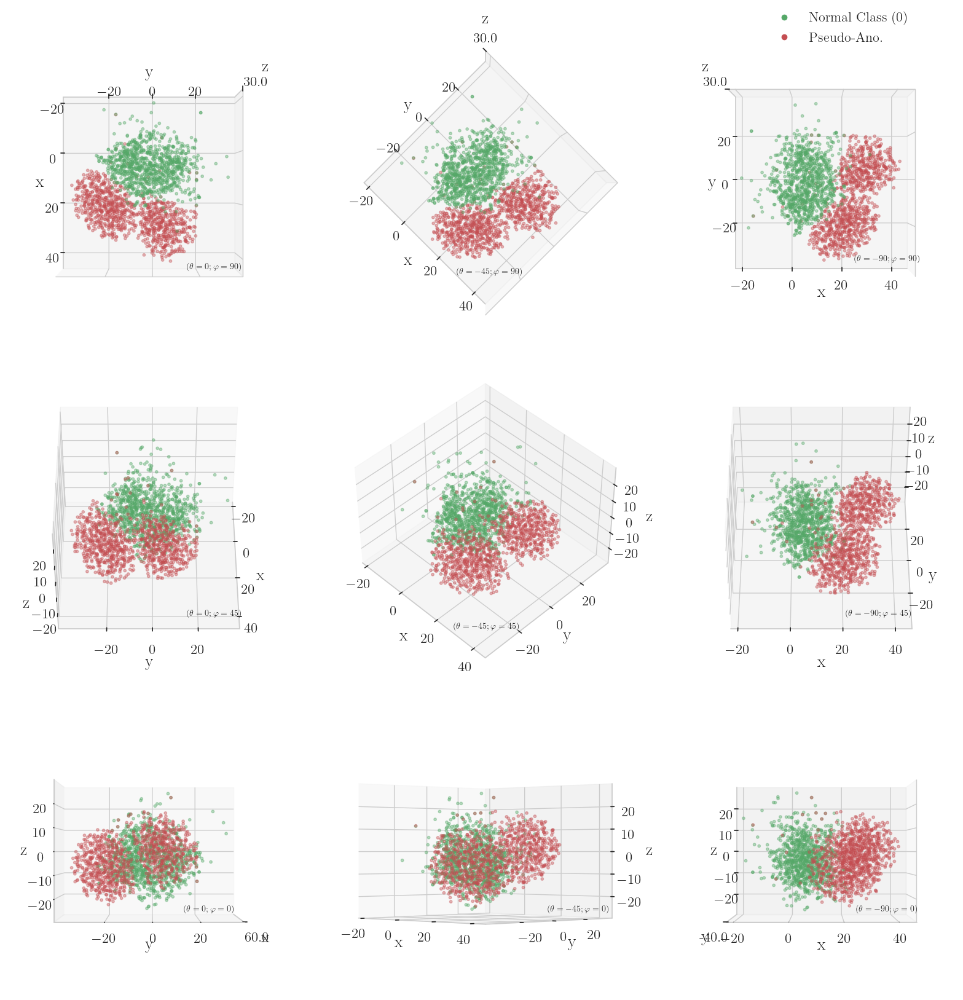

/opt/conda/envs/perturbations/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or axes decorations smaller.
  fig.canvas.print_figure(bytes_io, **kw)


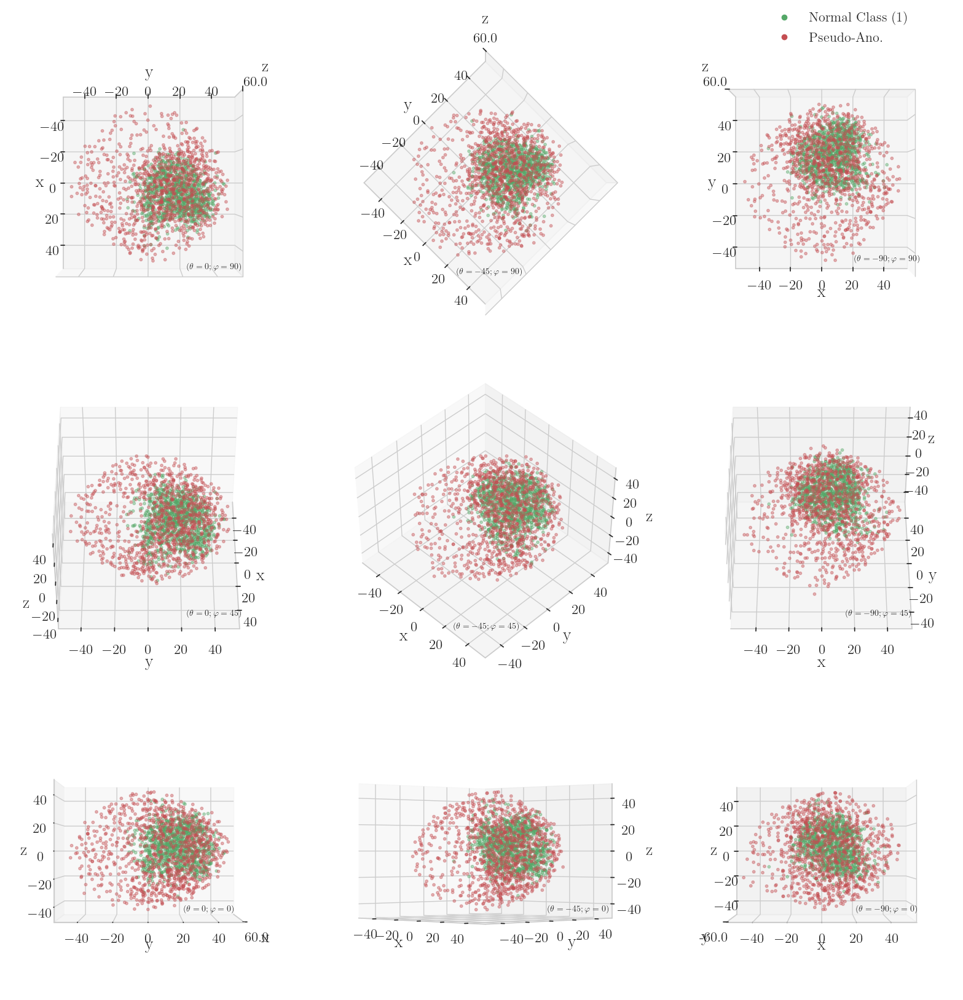

/opt/conda/envs/perturbations/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or axes decorations smaller.
  fig.canvas.print_figure(bytes_io, **kw)


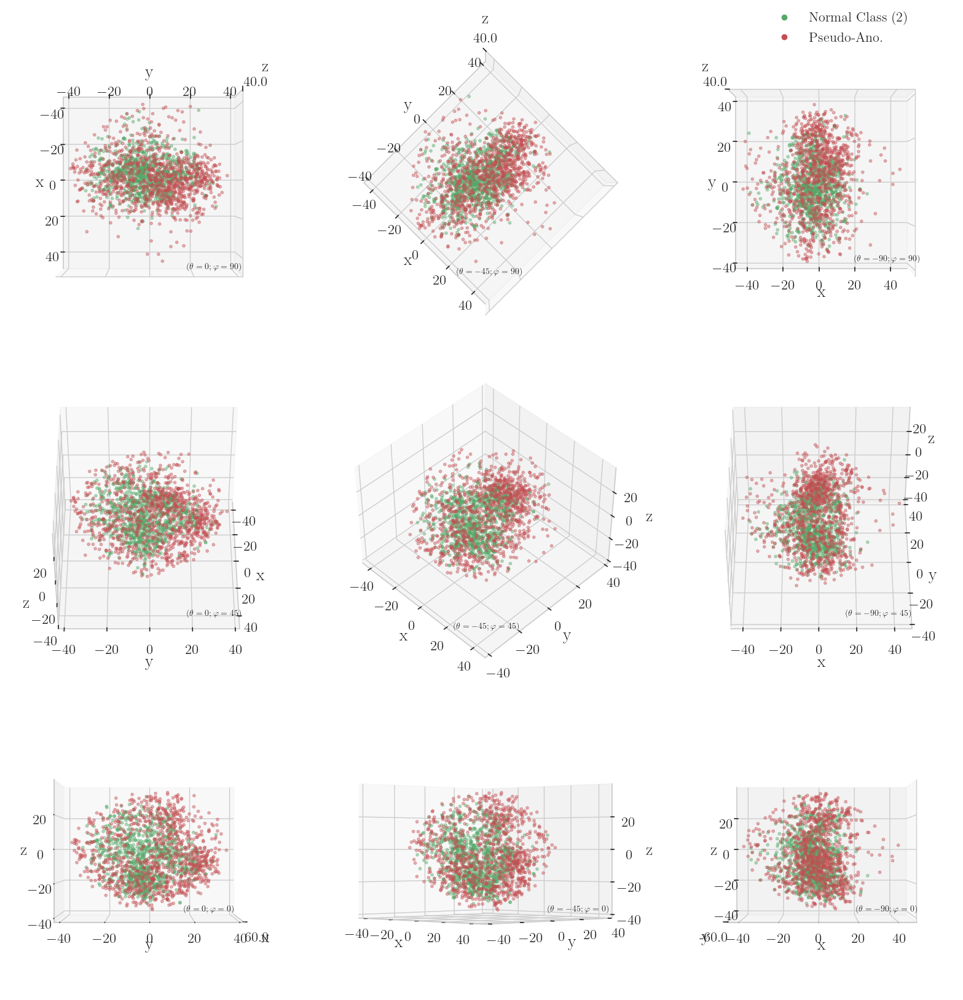

/opt/conda/envs/perturbations/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or axes decorations smaller.
  fig.canvas.print_figure(bytes_io, **kw)


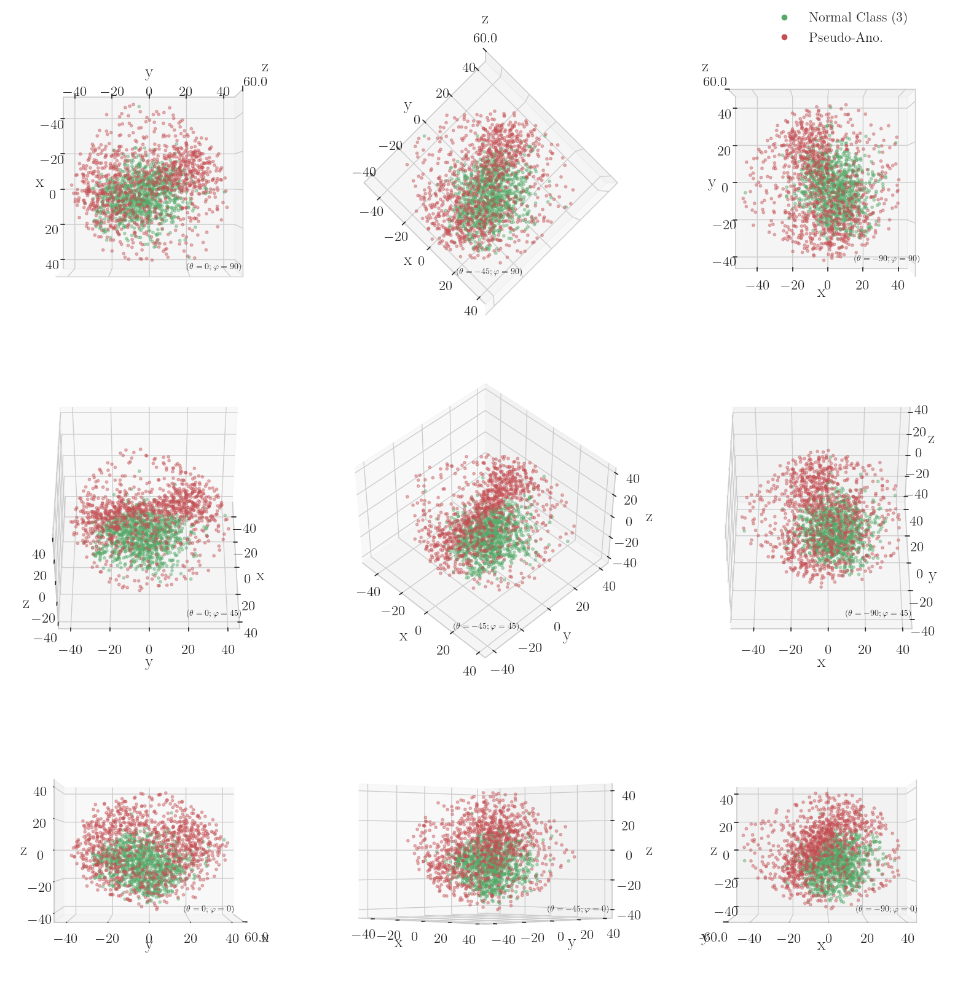

/opt/conda/envs/perturbations/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or axes decorations smaller.
  fig.canvas.print_figure(bytes_io, **kw)


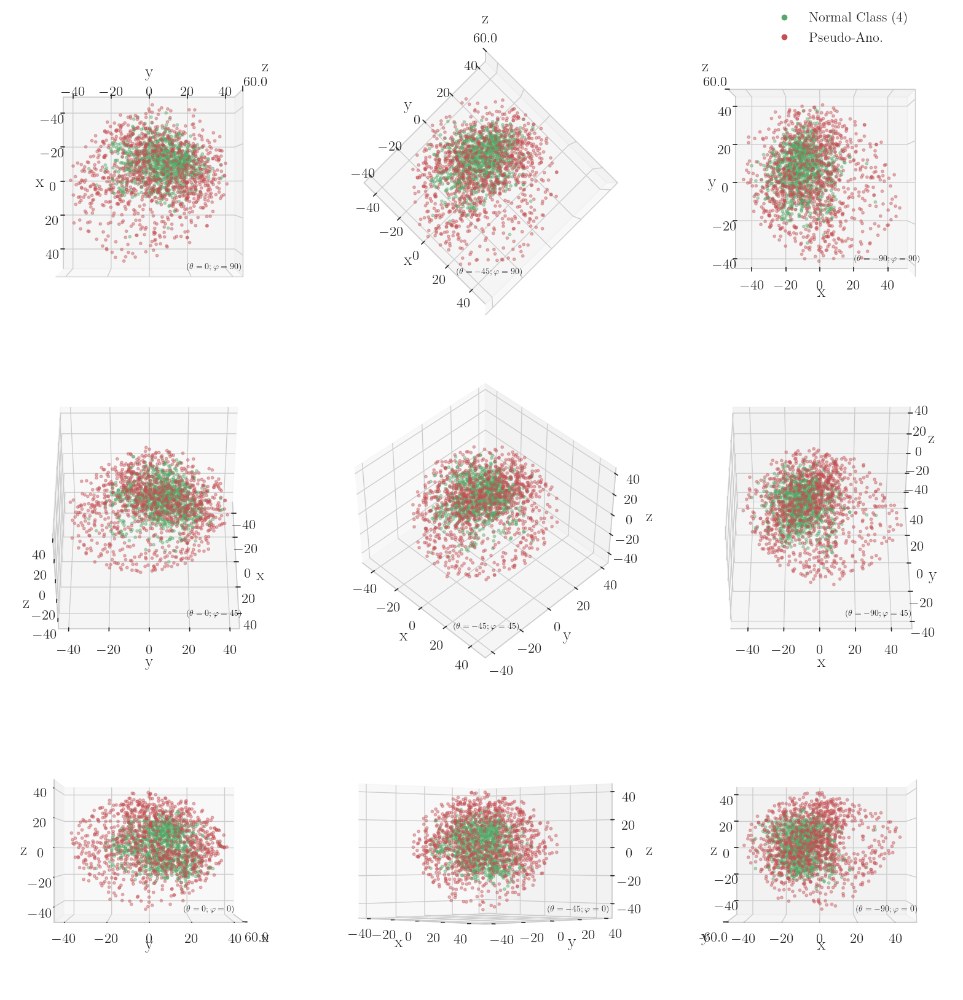

/opt/conda/envs/perturbations/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or axes decorations smaller.
  fig.canvas.print_figure(bytes_io, **kw)


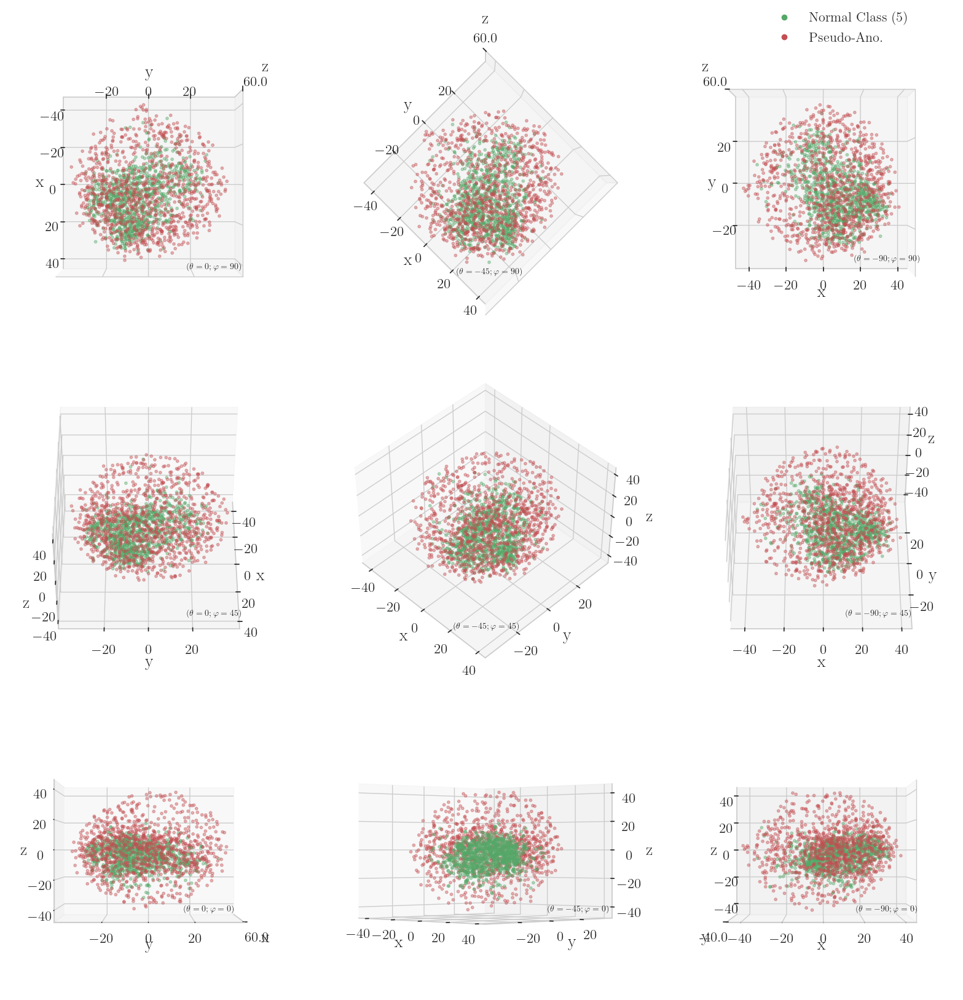

/opt/conda/envs/perturbations/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or axes decorations smaller.
  fig.canvas.print_figure(bytes_io, **kw)


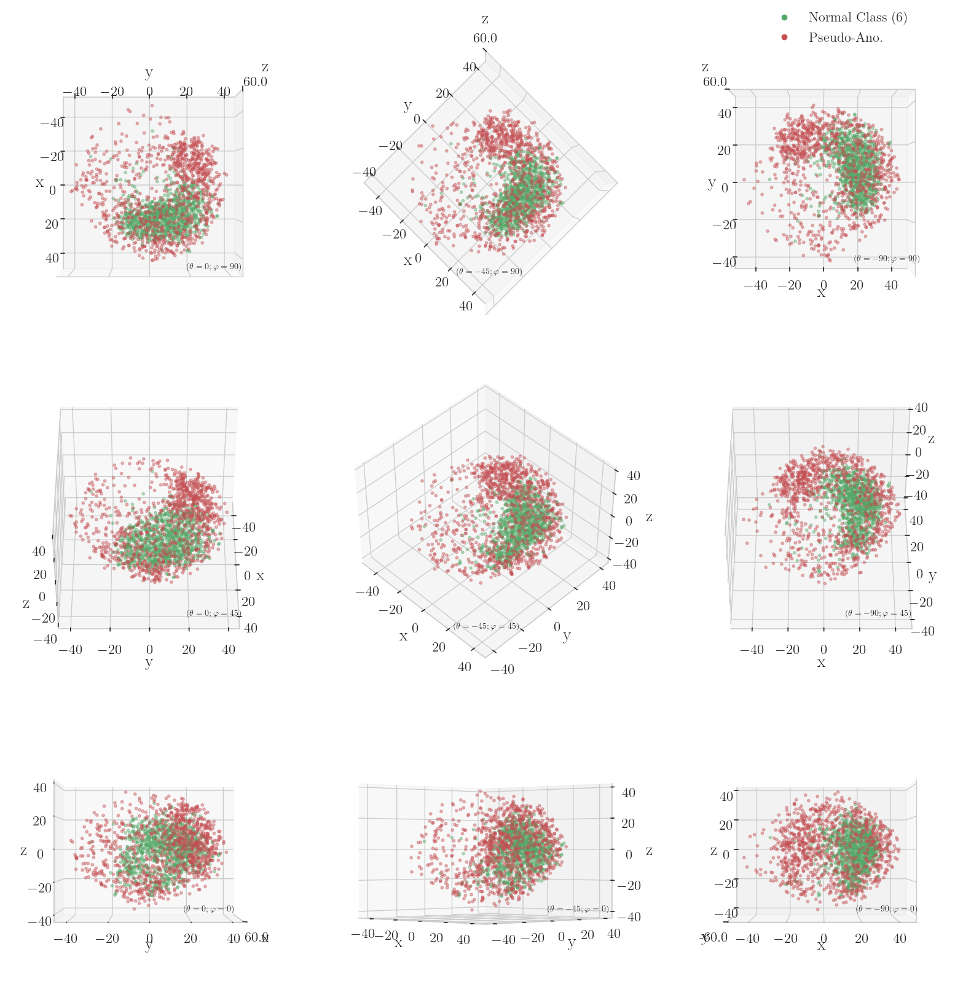

/opt/conda/envs/perturbations/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or axes decorations smaller.
  fig.canvas.print_figure(bytes_io, **kw)


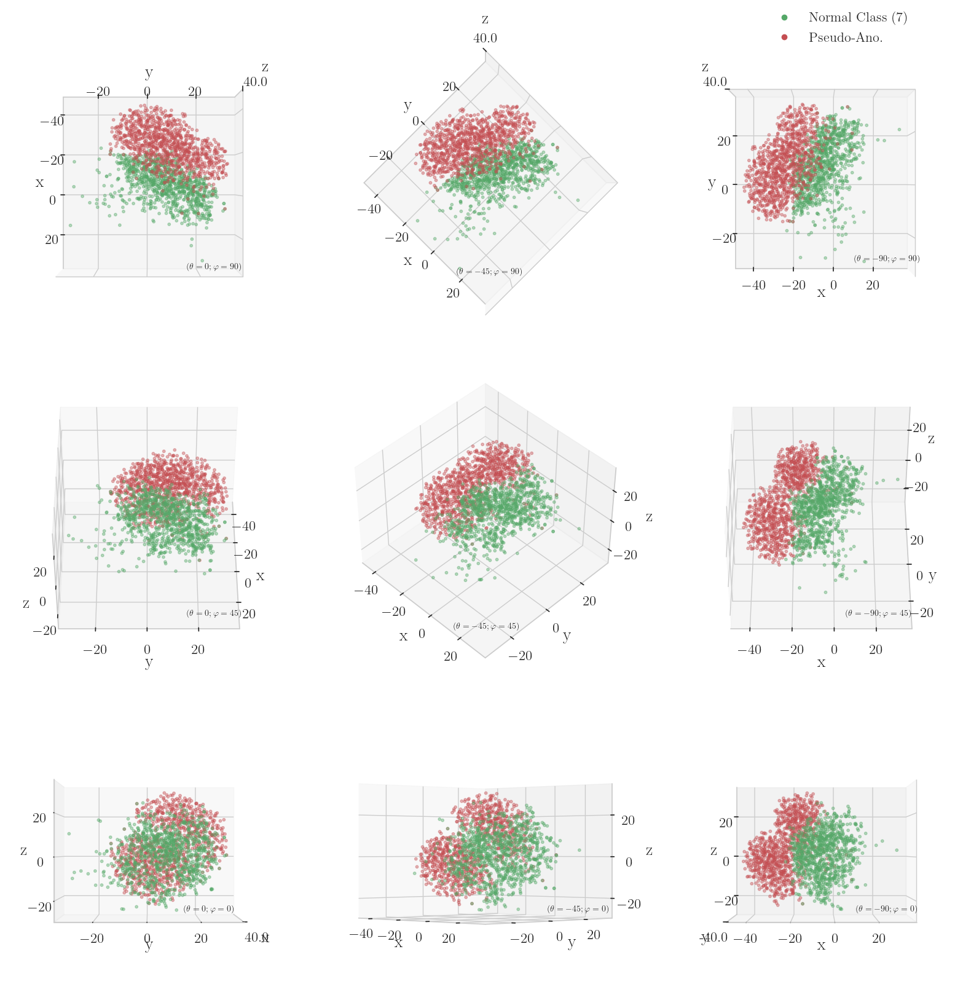

/opt/conda/envs/perturbations/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or axes decorations smaller.
  fig.canvas.print_figure(bytes_io, **kw)


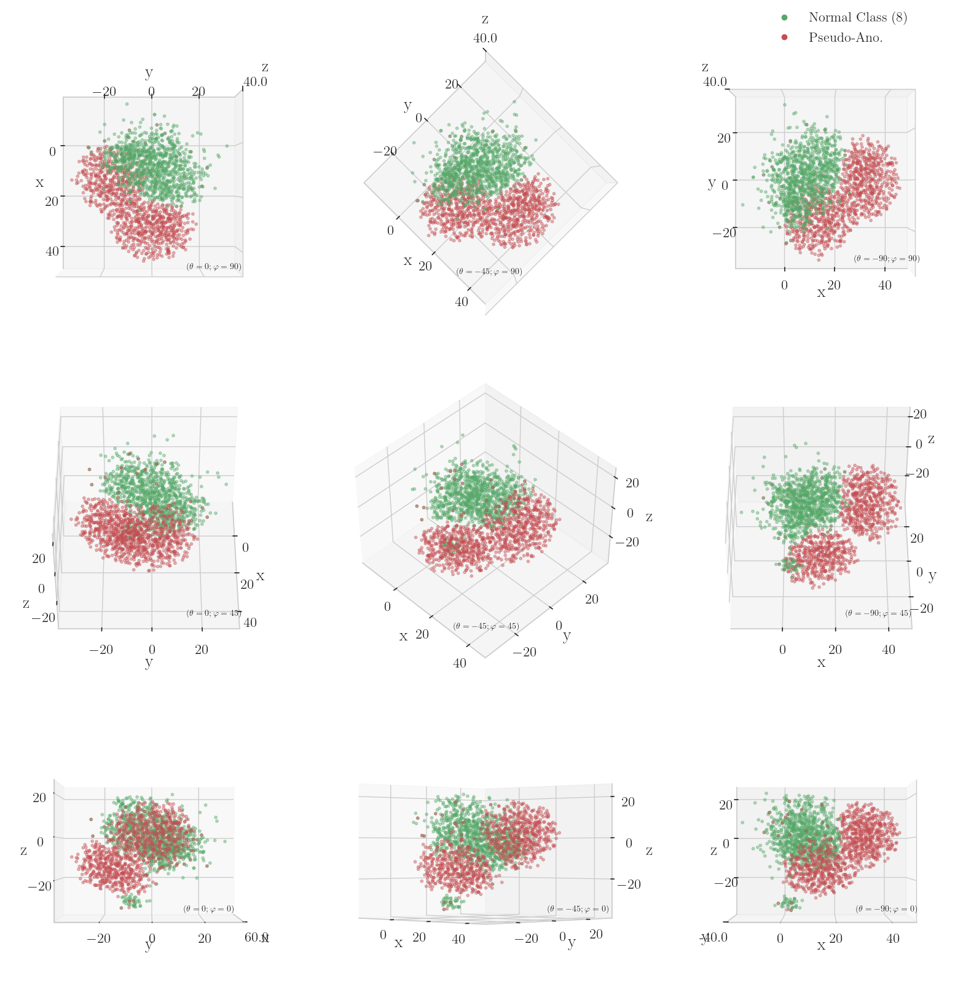

/opt/conda/envs/perturbations/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or axes decorations smaller.
  fig.canvas.print_figure(bytes_io, **kw)


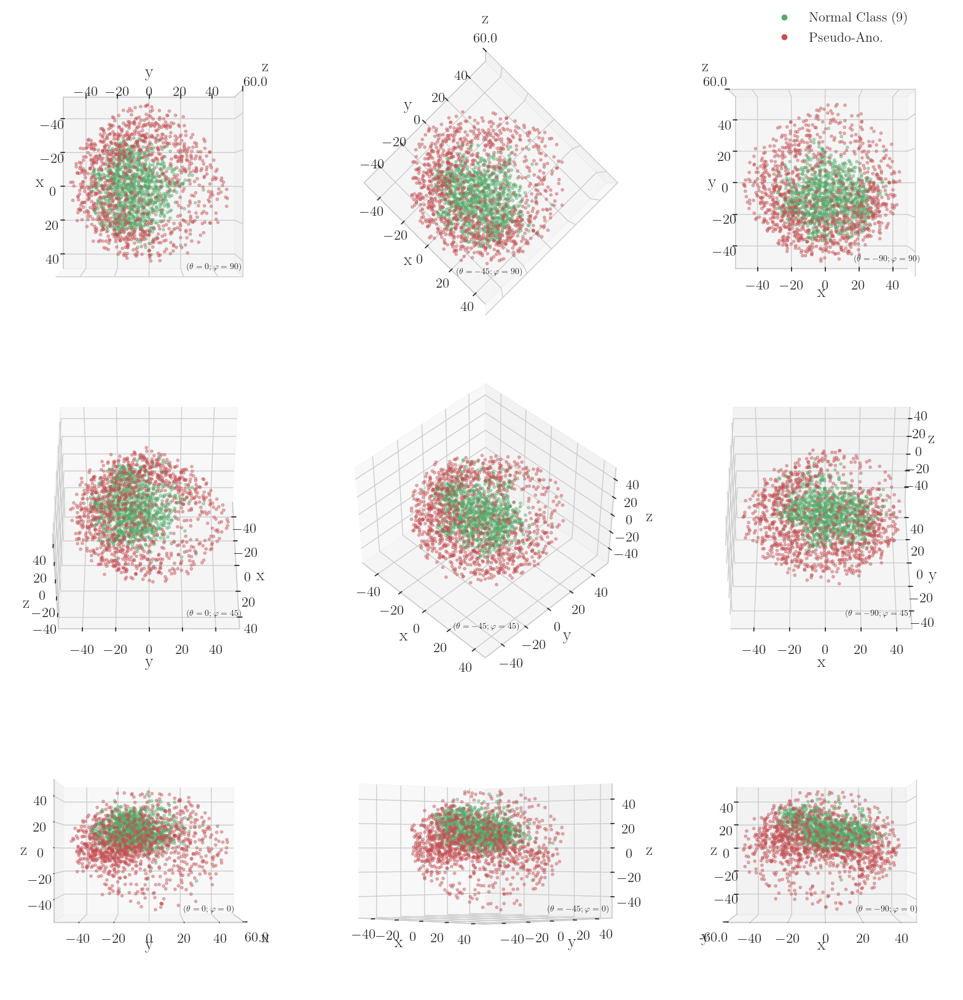

In [14]:
for normal_class in range(0, 10):
    ratio = .3
    preds_3d, targets = process_to_nd(preds_sorted, pseudo_preds_sorted, normal_class=normal_class, ndim=3, ratio = ratio)
    figure_3d = plt.figure(figsize=(20, 20), constrained_layout=True)
    azims = [0, -45, -90, 0, -45, -90,  0, -45, -90]
    elevs = [90, 90, 90, 45, 45, 45, 0, 0, 0]

    args = {"rc": {'text.usetex' : True, "font.family": 'LM Roman 10', "axes.formatter.use_mathtext": True}, "style": "whitegrid"}
    sns.set(font_scale=1.5, **args)

    color_normal = ListedColormap(sns.color_palette()[0])
    color_anomalies = ListedColormap(sns.color_palette()[6])
    color_pseudo = ListedColormap(sns.color_palette()[1])
    color_normal = ListedColormap(sns.color_palette()[2])
    color_pseudo = ListedColormap(sns.color_palette()[3])
    # color_pseudo_from_ano = ListedColormap(sns.color_palette()[4])
    ys = [.2, .18, .23, .15, 0.1, 0.15, .3, .3, .3]
    xs = [.75, .53, .75, .75, .52, .72, .73, .85, .75]

    nb_ano = 9 * int(1000 * ratio)
    for i in range(9):
        ax = figure_3d.add_subplot(3, 3, 1 + i, projection='3d')

        sc1 = ax.scatter(preds_3d[:1000, 0], preds_3d[:1000, 1], preds_3d[:1000, 2], c=targets[:1000], cmap=color_normal, alpha=.4, s=10)#, marker="o")
        # sc2 = ax.scatter(preds_3d[1000:-1000, 0], preds_3d[1000:-1000, 1], preds_3d[1000:-1000, 2], c=targets[1000:-1000], cmap=color_anomalies, alpha=.2, s=5, marker="o")
        sc3 = ax.scatter(preds_3d[1000 + nb_ano:, 0], preds_3d[1000 + nb_ano:, 1], preds_3d[1000 + nb_ano:, 2], c=targets[1000 + nb_ano:], cmap=color_pseudo, alpha=.4, s=10, marker="o")
        # sc3 = ax.scatter(preds_3d[10000:11000, 0], preds_3d[10000:11000, 1], preds_3d[10000:11000, 2], c=targets[10000:11000], cmap=color_pseudo, alpha=.4, s=10, marker="o")

        if i == 2:
            # handles = sc1.legend_elements()[0] + sc2.legend_elements()[0][:1] + sc3.legend_elements()[0]
            handles = sc1.legend_elements()[0] + sc3.legend_elements()[0]
            for h in handles:
                h._alpha = 1
            # ax.legend(handles=handles, labels=[f"Normal Class ({normal_class})", "Anomalies", "Pseudo-Ano."])
            ax.legend(handles=handles, labels=[f"Normal Class ({normal_class})", "Pseudo-Ano."])
            sns.move_legend(ax, "center right", bbox_to_anchor=(.87, 1.07), fontsize=16, facecolor=[0.82352941, 0.82745098, 0.83529412], fancybox=False, framealpha=.4, frameon=False)
        
        ax.set_title(r"{}".format(f"($\\theta = {azims[i]}; \\varphi = {elevs[i]}$)"), y=ys[i], x=xs[i], fontsize=10)

        ax.set_xlabel('x', fontsize=20)
        ax.set_ylabel('y', fontsize=20)
        ax.set_zlabel('z', fontsize=20)

        ax.azim = azims[i]
        ax.elev = elevs[i]
        
        if i < 3: 
            ticks = ax.get_zticks()
            ax.set_zticks([ticks[-1]], [ticks[-1]])
            
        if i == 6:
            ticks = ax.get_xticks()
            ax.set_xticks([ticks[-1]], [ticks[-1]])

        if i == 8:
            ticks = ax.get_yticks()
            ax.set_yticks([ticks[0]], [ticks[0]])

    # figure_3d.suptitle(title + " in Projected 3D Space" + f" ($NC = {normal_class}$)", y=1.01, fontsize=25)
    plt.show()
    base_folder = "plots/"
    figure_3d.savefig(f"{base_folder}{save_file}_nc{normal_class}_3ddata.pdf", dpi=150, bbox_inches='tight', transparent=True)